## Analysis of Audio Files

**"librosa" is a python module, which is used to analyse audio signals.**

In [1]:
#Load the audio file
import librosa
audio_path = r"C:\Users\DELL\Downloads\Audio\Audio+File+Analysis\Audio File Analysis\harvard.wav"
x , sr = librosa.load(audio_path)

In [2]:
#Playing an audio file
import IPython.display as ipd
ipd.Audio(audio_path)

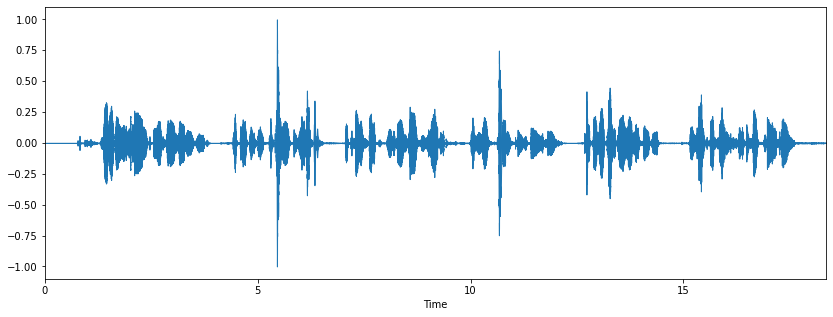

In [3]:
#Visualizing the audio - waveform
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

**Visualize the spectrum using "stft" function which converts data into a short term Fourier transform. It is used to convert signals such that we can determine the amplitude of a given frequency at a given time. We can also use "specshow" function to display the spectrogram.**

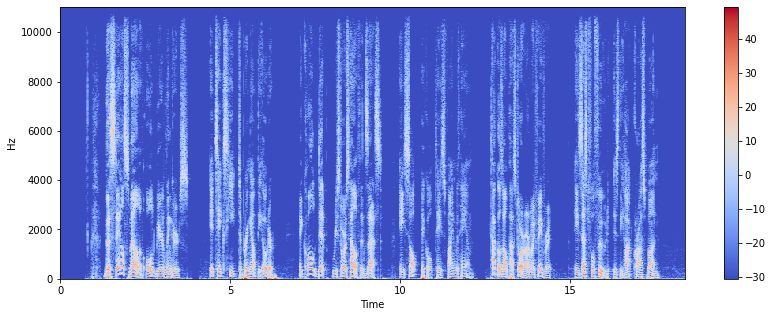

In [4]:
#Spectogram
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

**Since we see that all these actions are taking place at the bottom of the spectrum, we can convert the frequency axis to logarithmic one.**

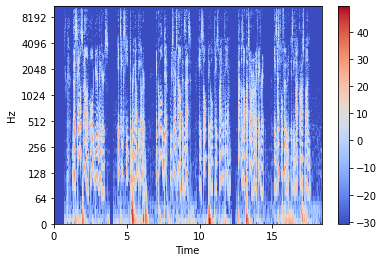

In [5]:
#Interchange the axis
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [6]:
#writing the output to File
import soundfile as sf
sf.write(r'C:\Users\DELL\Downloads\Audio\Audio+File+Analysis\Audio File Analysis\example1.wav', x, sr)
# librosa.write(r'C:\Users\DELL\Downloads\Audio+File+Analysis\Audio File Analysis\example1.wav', x, sr)

## Digitization and Recording of Speech


In [7]:
pip install SpeechRecognition

Note: you may need to restart the kernel to use updated packages.


In [8]:
import speech_recognition as sr

In [9]:
sr.__version__

'3.8.1'

In [10]:
# Create a Recognizer class
r = sr.Recognizer()

**"record" function captures data from a file. The context manager opens the file and reads its contents, storing the data in an audio file instance called "source", then the "record" method records the data from the entire file into an audio data instance.**

In [11]:
# USing record() to capture data from file
harvard = sr.AudioFile(audio_path)
with harvard as source:
    audio = r.record(source)

In [12]:
# Check the type of Audio
type(audio)

speech_recognition.AudioData

In [13]:
# Recognize the speech in Audio file
r.recognize_google(audio)

'the still smell of old beer drinkers it takes hi to bring out the order I called it yourself invest a salt a kotess find the M tacos Al pastor my favourite is just for food is Bihar cross bun'

In [14]:
# Capturing segments with offset of Audio
with harvard as source:
    audio = r.record(source, duration = 4)
r.recognize_google(audio)

'the still smell of old beer drinkers'

## Human Speech Production

In [15]:
pip install gTTS

Note: you may need to restart the kernel to use updated packages.


**To convert text to speech in python several APIs are available. One such API is "Google text to speech API", commonly known as gTTS API. gTTS is a very easy to use tool which converts the text entered into audio which can be saved as MP3 file.**

In [16]:
# import Packages 
from gtts import gTTS
import os

In [17]:
# The text you want to convert to human speech
mytext = "Welcome to your first session on Human Speech Production"

In [18]:
# Select the language
# English
language = 'en'

In [19]:
# Converting the text to human speech using gTTs(Google text to speech) API
myobj = gTTS(text=mytext, lang=language, slow=False)

In [37]:
# Saving the converted audio to any format
myobj.save("‪welcome.mp3")

In [39]:
# Playing the converted file
os.system("mpg321 welcome.mp3")

1

## Sampling Theorem

In [1]:
# Import libraries
from numpy import linspace,cos,pi,ceil,floor,arange
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sns.set(style='whitegrid')

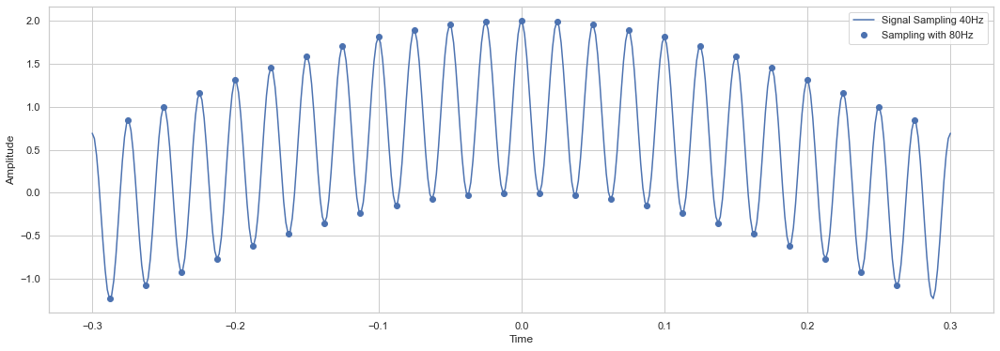

In [9]:
# Sampling a signal bandlimited to 40 Hz
# With sampling rate of 800 Hz
plt.figure(figsize=(18,6))
f = 40
tmin = -0.3
tmax = 0.3
t = linspace(tmin, tmax, 400)
x = cos(2*pi*t) + cos(2*pi*f*t)
plt.plot(t,x,label= "Signal Sampling 40Hz")
plt.legend()

# Sampling the signal with a sampling rate of 80Hz
# We are using Nyquist rate

T = 1/80
nmin = ceil(tmin/T)
nmax = floor(tmax/T)
n = arange(nmin, nmax)
x1 = cos(2*pi*n*T) + cos(2*pi*f*n*T)
plt.plot(n*T,x1,"bo",label="Sampling with 80Hz")  # "bo" is to explain it with "bullets"
plt.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

**If we take frequency lesser, as per Nyquist rate, this is called "aliasing" in which we are not able to recover the full signal and there will be loss.**

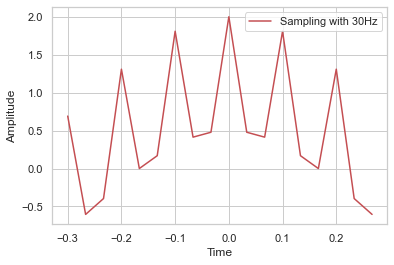

In [10]:
# Sampling the signal with a sampling rate of 30Hz
# We are "not" using Nyquist rate

T = 1/30
nmin = ceil(tmin/T)
nmax = floor(tmax/T)
n = arange(nmin, nmax)
x2 = cos(2*pi*n*T) + cos(2*pi*f*n*T)
plt.plot(n*T,x2,"-r",markersize = 8,label="Sampling with 30Hz")  # "-r" is red colored dashed line"
plt.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

**Combine**

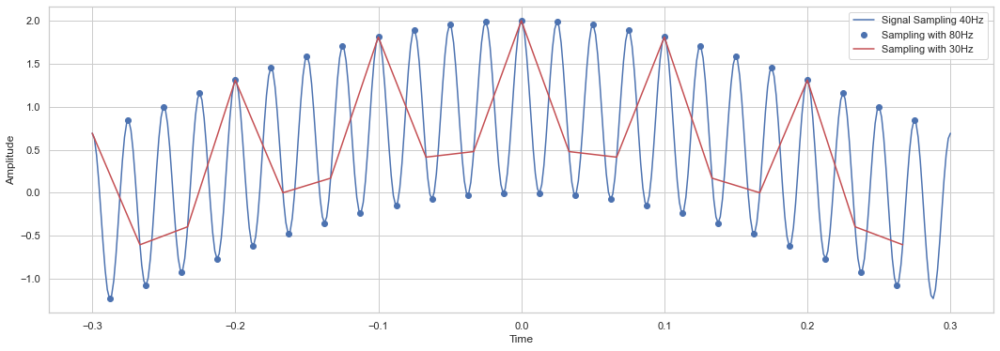

In [11]:
# Sampling a signal bandlimited to 40 Hz
# With sampling rate of 800 Hz
plt.figure(figsize=(18,6))
f = 40
tmin = -0.3
tmax = 0.3
t = linspace(tmin, tmax, 400)
x = cos(2*pi*t) + cos(2*pi*f*t)
plt.plot(t,x,label= "Signal Sampling 40Hz")
plt.legend()

# Sampling the signal with a sampling rate of 80Hz
# We are using Nyquist rate

T = 1/80
nmin = ceil(tmin/T)
nmax = floor(tmax/T)
n = arange(nmin, nmax)
x1 = cos(2*pi*n*T) + cos(2*pi*f*n*T)
plt.plot(n*T,x1,"bo",label="Sampling with 80Hz")  # "bo" is to explain it with "bullets"
 
# Sampling the signal with a sampling rate of 30Hz
# We are "not" using Nyquist rate

T = 1/30
nmin = ceil(tmin/T)
nmax = floor(tmax/T)
n = arange(nmin, nmax)
x2 = cos(2*pi*n*T) + cos(2*pi*f*n*T)
plt.plot(n*T,x2,"-r",markersize = 8,label="Sampling with 30Hz")  # "-r" is red colored dashed line"
plt.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

**We can see the loss in the 30Hz, it can't capture proper cycle. We can't recover the signal properly below Nyquist level.**

## Building a Basic Language Model

**Building a basic Language model using trigrams of the Reuters corpus. Reuters corpus is a collection of 10,788 news documents totalling 1.3 million words. A language model can be built using a few lines of code using NLTK package. NLTK: Natural Language Tool Kit, an open source python package for doing NLP in python.**

In [1]:
from nltk.corpus import reuters
from nltk import bigrams,trigrams
from collections import Counter,defaultdict

**Bigrams and trigrams are basic building blocks of natural language processing. For NLP, we use a collection of documents to train our models.**

In [4]:
import nltk
nltk.download('reuters') 

[nltk_data] Downloading package reuters to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...


True

In [5]:
# Create a placeholder for model
model = defaultdict(lambda:defaultdict(lambda:0))

In [6]:
# Count frequency of co-occurrence, i.e words occurring in sentences together
for sentence in reuters.sents():
    for w1,w2,w3 in trigrams(sentence,pad_right = True, pad_left=True):
        model[(w1,w2)][w3]+=1

In [7]:
# Lets transform the counts to probabilities
for w1_w2 in model:
    total_count=float(sum(model[w1_w2].values()))
    for w3 in model[w1_w2]:
        model[w1_w2][w3]/=total_count

**Here is a script to generate a random piece of text using our n-gram model.**

In [35]:
import random

# Starting words
text= ["today", "the"]
sentence_finished= False

while not sentence_finished:
    # Select a random probability threshold
    r = random.random()
    accumulator=.0

    for word in model[tuple(text[-2:])].keys():
        accumulator+=model[tuple(text[-2:])][word]
        # Select words that are above probability threshold
        if accumulator>=r:
            text.append(word)
            break

    if text[-2:]==[None,None]:
        sentence_finished=True
print(" ".join([t for t in text if t]))

today the company it did not see any motion picture admissions in the third quarter results of a meeting of trade legislation was prompted by a shift to private bidders but not on China ' s a case brought by fellow ITC creditor banks , annoyed at restrictive Japanese trade practices or injury from imports .


## Audio Signal Feature Extraction

**Feature Extraction basics**

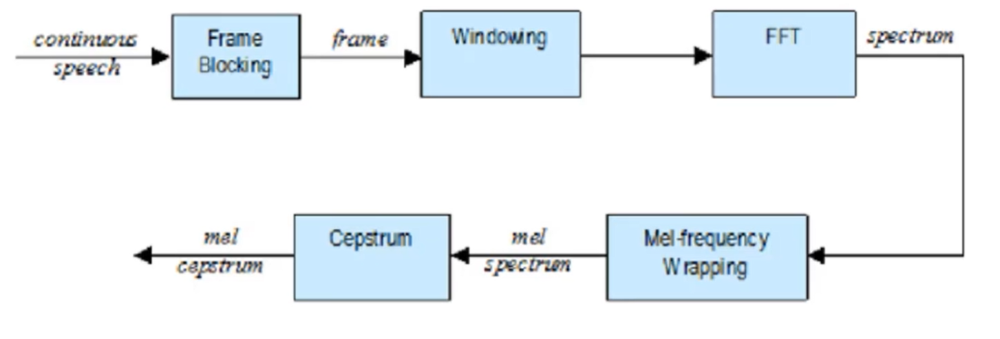

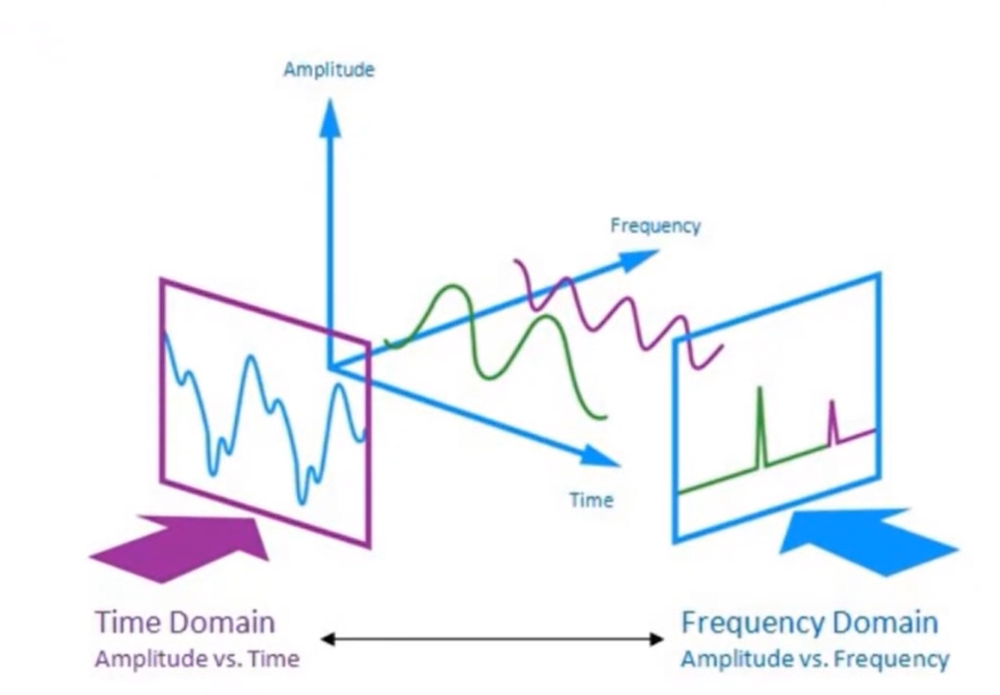

**Install important libraries. PyAudio is a package used to listen the audio file. It gives start and end button.**

In [38]:
!pip install numba==0.48
!pip install librosa
!pip install PyAudio

**Including Libraries and packages. "display" library is used to display our audio signals.**

In [43]:
import librosa
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import librosa.display 

**Loading an Audio. "librosa.load" helps in loading the audio file. "x" will give only one dimensional vector of our music file, "sr" is called Sampling Rate, by default librosa gives Sampling Rate as 22 KHz, can specify "sr= None" or "sr = 44100" (override) inside librosa.load as a parameter.**

In [51]:
audio_path = r"C:\Users\DELL\Downloads\Audio\Audio+File+Analysis\Audio File Analysis\harvard.wav"
x,sr  = librosa.load(audio_path)
print(type(x),type(sr))

<class 'numpy.ndarray'> <class 'int'>


**Playing an Audio.**

In [52]:
import IPython.display as ipd

In [53]:
ipd.Audio(audio_path)

**Plot the Signal. Waveform gives a plot between amplitude vs time domain.**

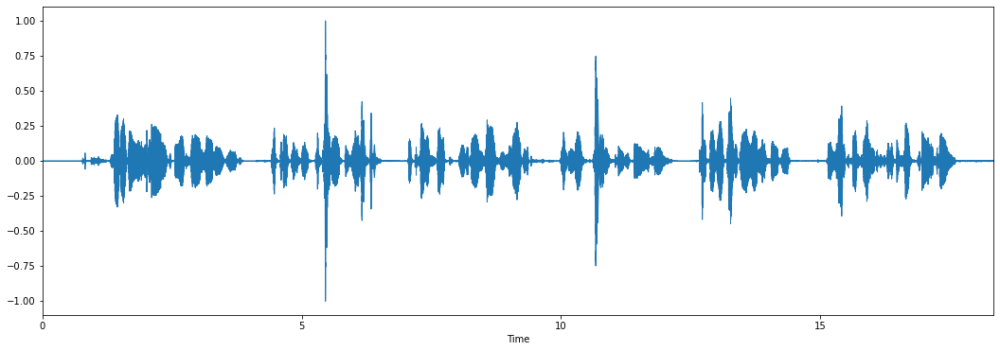

In [54]:
plt.figure(figsize=(18,6))
librosa.display.waveplot(x,sr=sr)
plt.show()

**Display Spectrogram. Determine in amplitude vs frequency domain. "stft" is Short-Time Fourier Transform, transforms from Time domain to Frequency domain.**

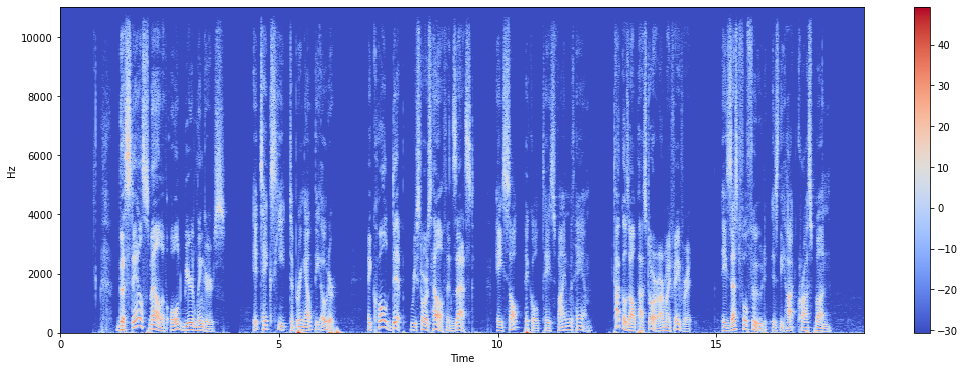

In [62]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(18,6))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()
plt.show()

**Zooming in and find Zero Crossing Rate (at what rate is it crossing the signal from positive to negative).**

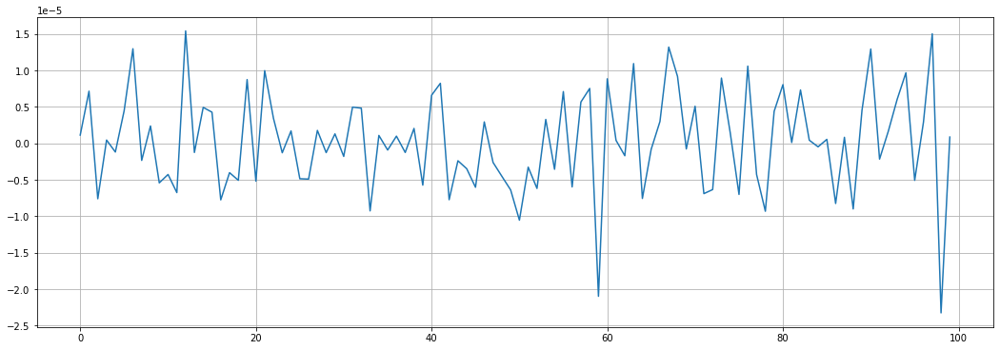

In [64]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(18,6))
plt.plot(x[n0:n1])
plt.grid()

**We can count the number of time this wave is crossing 0 from positive to negative or vice-versa.**

In [65]:
zero_crossings = librosa.zero_crossings(x[n0:n1],pad = False)
print(sum(zero_crossings))

64


**Spectral Centroid -- Centre of Mass -- Weighted mean of the frequencies present in the sound.**

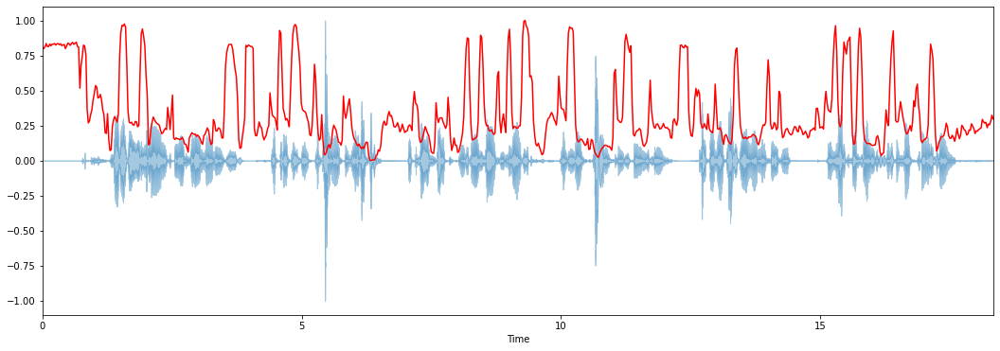

In [67]:
spectral_centroids= librosa.feature.spectral_centroid(x,sr=sr)[0]
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
def normalize(x,axis=0):
    return sklearn.preprocessing.minmax_scale(x,axis=axis)
plt.figure(figsize=(18,6))
librosa.display.waveplot(x,sr=sr,alpha=0.4)
plt.plot(t,normalize(spectral_centroids),color = "r")
plt.show()

**Spectral RollOff.**

[]

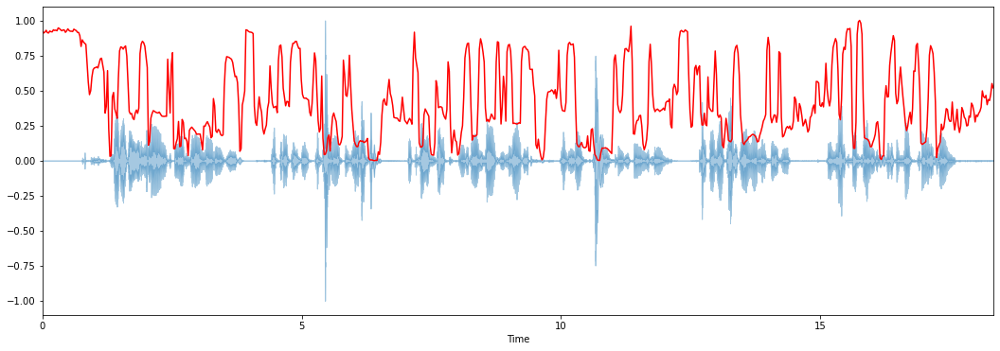

In [68]:
spectral_rolloff = librosa.feature.spectral_rolloff(x,sr=sr)[0]
plt.figure(figsize=(18,6))
librosa.display.waveplot(x,sr=sr,alpha=0.4)
plt.plot(t,normalize(spectral_rolloff),color='r')
plt.plot()

**MFCC - Mel-Frequency Cepstral Coefficients.**

(20, 791)


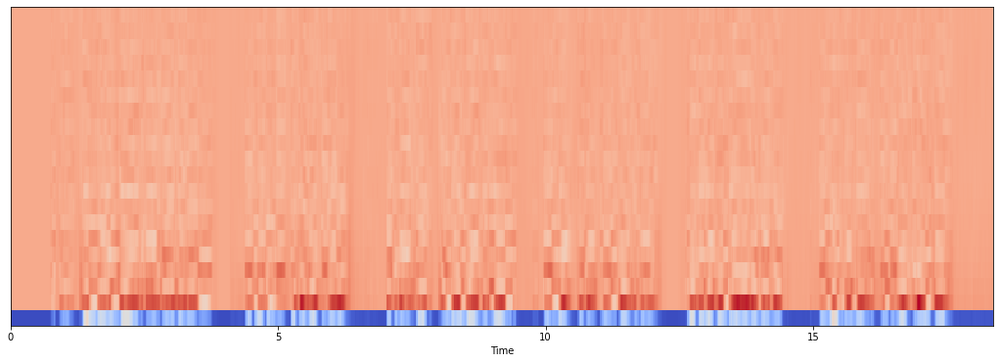

In [69]:
mfcc = librosa.feature.mfcc(x,sr=sr)
print(mfcc.shape)
plt.figure(figsize=(18,6))
librosa.display.specshow(mfcc,sr=sr,x_axis="time")
plt.show()

**20 is mfcc, number of frames it has is 791.**

## Force Alignment Expectation

**Import Libraries. In this we will try to generate a transcript and examine whats its expectation.**

In [8]:
from __future__ import division
from numpy import array, linspace,random,warnings
from scipy.stats import bernoulli,norm
from matplotlib import cm
from matplotlib.pyplot import figure,subplots

In [4]:
ma_true = 4  # here we are choosing random seed i.e 4 and 7
mb_true = 7
fa = norm(ma_true,1) # here we are creating normal distribution for ma_true and mb_true
fb = norm(mb_true,1)
fz = bernoulli(0.225)
def sample(n=10):
    tmp = fz.rvs(n)
    return tmp*(fb.rvs(n))+(1-tmp)*fa.rvs(n)
xs = sample(1000)

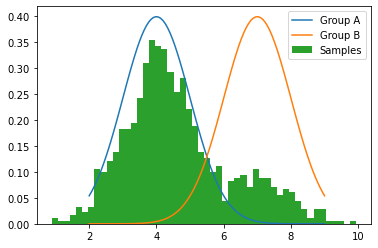

In [9]:
# Histogram to analyse the given data
f,ax = subplots()
x = linspace(ma_true-2,mb_true+2,100)
ax.plot(x,fa.pdf(x),label = 'Group A')
ax.plot(x,fb.pdf(x),label = 'Group B')
ax.hist(xs,bins = 50,density =1,label = 'Samples')
ax.legend(loc = 0)

**Some samples belong to Group A and some to Group B but some are difficult to separate.**

**sympy is a library to create a variable symbolically and give us output compatible with numpy.**

In [10]:
# Minimizing the expectation
import sympy
from sympy.abc import x,z
from sympy import stats

mu_a,mu_b = sympy.symbols('mu_a,mu_b')
na = stats.Normal('x',mu_a,1)
nb = stats.Normal('x',mu_b,1)

L = (stats.density(na)(x) + stats.density(nb)(x))/2

**Here we calculate the expectation steps.**

In [11]:
def ez(x,mu_a,mu_b):
    return norm(mu_a).pdf(x) /(norm(mu_a).pdf(x) + norm(mu_b).pdf(x))

Text(0.5, 1.0, 'Incomplete likelihood')

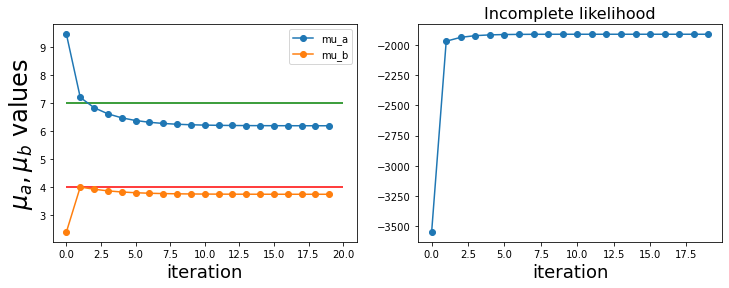

In [12]:
Lf = sympy.lambdify((x,mu_a,mu_b),sympy.log(abs(L)),'numpy')

def run():
    out,lout = [],[]
    mu_a_n = random.random()*10
    mu_b_n = random.random()*10
    for i in range(20):
        tau = ez(xs,mu_a_n,mu_b_n)
        lout.append(sum(Lf(xs,mu_a_n,mu_b_n)))
        out.append((mu_a_n,mu_b_n))
        mu_a_n = (sum(tau*xs)/sum(tau))
        mu_b_n = (sum((1-tau)*xs)/sum(1-tau))
    return out,lout

out,lout = run()
fig = figure()
fig.set_figwidth(12)
ax = fig.add_subplot(121)
ax.plot(array(out),'o-')
ax.legend(('mu_a','mu_b'),loc = 0)
ax.hlines([ma_true,mb_true],0,len(out),['r','g'])
ax.set_xlabel('iteration',fontsize = 18)
ax.set_ylabel('$\mu_a,\mu_b$ values',fontsize = 24)
ax = fig.add_subplot(122)
ax.plot(array(lout),'o-')
ax.set_xlabel('iteration',fontsize=18)
ax.set_title('Incomplete likelihood',fontsize = 16)

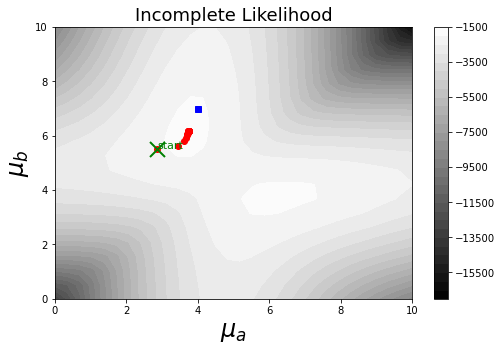

In [13]:
out,lout = run()
mua_step = linspace(0,10,30)
mub_step = linspace(0,10,20)
z = Lf(xs,mua_step[:,None],mub_step[:,None,None]).sum(axis = 2)
fig = figure(figsize=(8,5))
ax = fig.add_subplot(111)
p = ax.contourf(mua_step,mub_step,z,30,cmap=cm.gray)
xa,xb = zip(*out)
ax.plot(xa,xb,'ro')
ax.plot(ma_true,mb_true,'bs')
ax.plot(xa[0],xb[0],'gx',ms=15,mew=2.0)
ax.text(xa[0],xb[0],'start',color = 'g',fontsize=11.0)
ax.set_xlabel('$\mu_a$',fontsize=24)
ax.set_ylabel('$\mu_b$',fontsize=24)
ax.set_title('Incomplete Likelihood',fontsize = 18)
fig.colorbar(p)

## Spectrum Analysis

**Import important libraries**

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import seaborn as sns

In [16]:
sns.set(style="darkgrid")

**Generate a frequency chirp signal. It tells how the power spectral density looks like.**

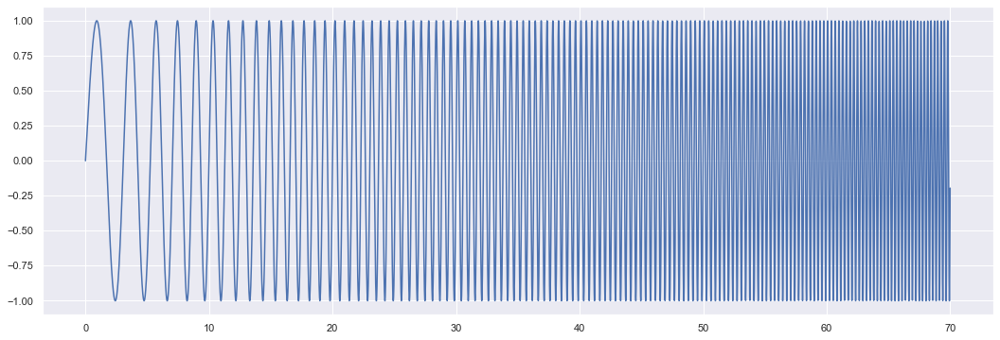

In [18]:
np.random.seed(0)

Fs = 120
time_step = 1/Fs
time_vec = np.arange(0,70,time_step)

sig = np.sin(0.5*np.pi*time_vec*(1+0.1*time_vec))

plt.figure(figsize=(18,6))
plt.plot(time_vec,sig)
plt.show()

**Plot the Spectrum of the given signal.**

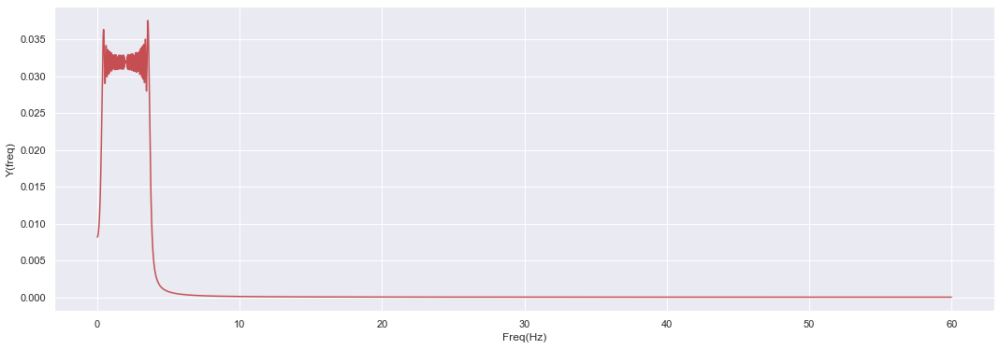

In [21]:
n=len(sig)
k = np.arange(n)
T= n/Fs
freq = k/T 
freq = freq[range(n//2)]
Y = scipy.fft.fft(sig)/n
Y = Y[range(n//2)]
plt.figure(figsize = (18,6))
plt.plot(freq,abs(Y),'r')
plt.xlabel("Freq(Hz)")
plt.ylabel("Y(freq)")
plt.show()

**Compute and plot the spectrogram. The spectrum of the signal on consecutive time windows.**

In [22]:
from scipy import signal

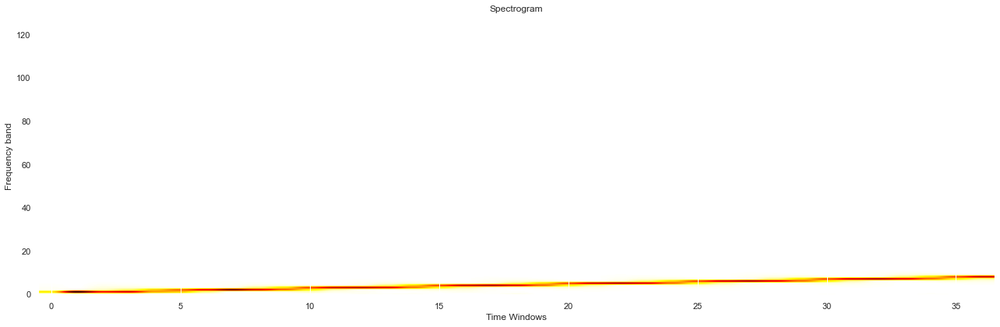

In [24]:
freqs,time,spectrogram = signal.spectrogram(sig)
plt.figure(figsize=(18,6))
plt.imshow(spectrogram,aspect = 'auto',cmap = "hot_r", origin = "lower")
plt.title("Spectrogram")
plt.ylabel("Frequency band")
plt.xlabel("Time Windows")
plt.tight_layout()

**Compute and plot the power spectral density (PSD). The power of the signal per frequency band.**

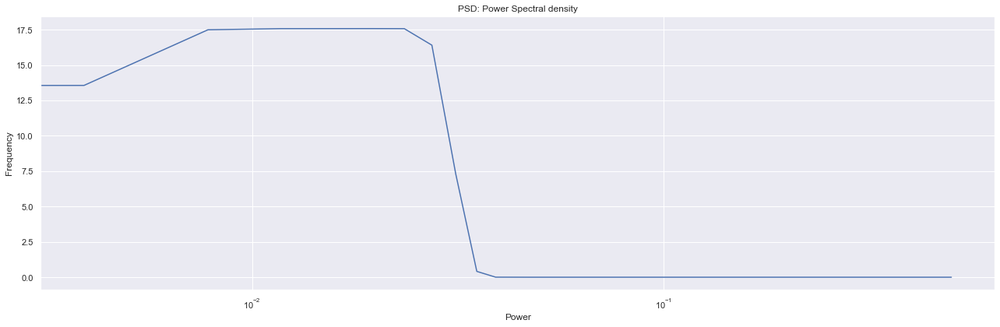

In [25]:
freqs,psd = signal.welch(sig)

plt.figure(figsize=(18,6))
plt.semilogx(freqs,psd)
plt.title("PSD: Power Spectral density")
plt.ylabel("Frequency")
plt.xlabel("Power")
plt.tight_layout()
plt.show()

## Speech to Text Modeling

**Downloading the data**

In [6]:
!wget "http://download.tensorflow.org/data/speech_commands_v0.01.tar.gz"

--2021-11-25 15:18:48--  http://download.tensorflow.org/data/speech_commands_v0.01.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.167.48
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.167.48|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1489096277 (1.4G) [application/gzip]
Saving to: 'speech_commands_v0.01.tar.gz'

     0K .......... .......... .......... .......... ..........  0%  745K 32m31s
    50K .......... .......... .......... .......... ..........  0% 3.91M 19m17s
   100K .......... .......... .......... .......... ..........  0% 6.44M 14m5s
   150K .......... .......... .......... .......... ..........  0% 1.62M 14m12s
   200K .......... .......... .......... .......... ..........  0% 17.4M 11m38s
   250K .......... .......... .......... .......... ..........  0% 12.4M 10m1s
   300K .......... .......... .......... .......... ..........  0% 2.70M 9m50s
   350K .......... .......... .......... ..

**Unzip the tar file**

In [14]:
import tarfile
file = tarfile.open('speech_commands_v0.01.tar.gz')
file.extractall('./Speech')
file.close()

**Delete the extra files of extracted file**

*1. LICENSE*

*2. README.md*

*3. testing_list.txt*

*4. validation_list.txt*

**Import the packages (multi-class classification problem)**

In [1]:
import os
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import wavfile
import warnings
warnings.filterwarnings("ignore")

**Data Exploration and Visualization**

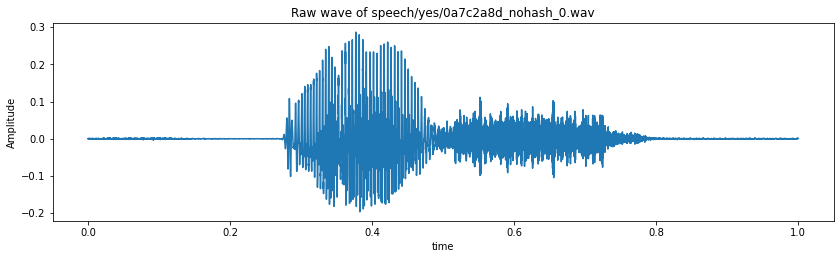

In [2]:
train_audio_path = 'speech/'
samples,sample_rate = librosa.load(train_audio_path+'yes/0a7c2a8d_nohash_0.wav',sr = 16000)
fig = plt.figure(figsize = (14,8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + 'speech/yes/0a7c2a8d_nohash_0.wav')
ax1.set_xlabel('time')
ax1.set_ylabel("Amplitude")
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

**Sampling Rate**

In [3]:
ipd.Audio(samples, rate = sample_rate)
print(sample_rate)

16000


**Resampling**

In [4]:
samples = librosa.resample(samples, sample_rate, 8000)
ipd.Audio(samples,rate = 8000)

**Number of recording of each voices**

In [5]:
labels = os.listdir(train_audio_path)
labels

['bed',
 'bird',
 'cat',
 'dog',
 'down',
 'eight',
 'five',
 'four',
 'go',
 'happy',
 'house',
 'left',
 'marvin',
 'nine',
 'no',
 'off',
 'on',
 'one',
 'right',
 'seven',
 'sheila',
 'six',
 'stop',
 'three',
 'tree',
 'two',
 'up',
 'wow',
 'yes',
 'zero',
 '_background_noise_']

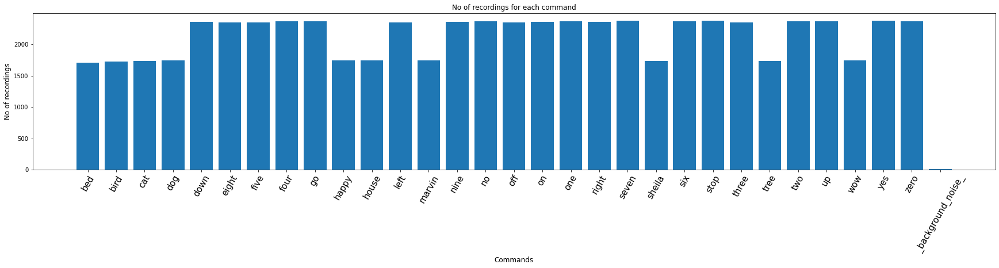

In [6]:
# find count of each label and plot bar graph
no_of_recordings=[]
for label in labels:
    waves = [f for f in os.listdir(train_audio_path + label) if f.endswith('.wav')]
    no_of_recordings.append(len(waves))

#plot
plt.figure(figsize=(30,5))
index = np.arange(len(labels))
plt.bar(index, no_of_recordings)
plt.xlabel("Commands" ,fontsize = 12)
plt.ylabel("No of recordings", fontsize=12)
plt.xticks(index, labels, fontsize=15, rotation = 60)
plt.title("No of recordings for each command")
plt.show()

labels=['yes', 'no', 'up', 'down','left', 'right', 'on', 'off', 'stop', 'go']

**Duration of recordings**

(array([1.5000e+01, 3.0000e+01, 4.4000e+01, 1.3800e+02, 1.3600e+02,
        1.7900e+02, 3.6600e+02, 4.3400e+02, 5.9300e+02, 2.1747e+04]),
 array([0.418 , 0.4762, 0.5344, 0.5926, 0.6508, 0.709 , 0.7672, 0.8254,
        0.8836, 0.9418, 1.    ]),
 <BarContainer object of 10 artists>)

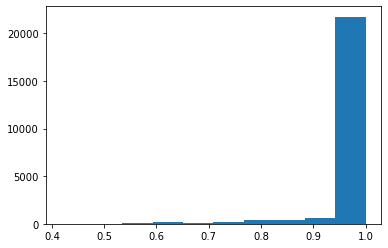

In [7]:
duration_of_recordings=[]
for label in labels:
    waves = [f for f in os.listdir(train_audio_path + '/' + label) if f.endswith('.wav')]
    for wav in waves:
        sample_rate,samples = wavfile.read(train_audio_path + '/' + label + '/'+ wav)
        duration_of_recordings.append(float(len(samples)/sample_rate))
plt.hist(np.array(duration_of_recordings))        

**Preprocessing the audio waves (it will take an hour to run)**

In [8]:
train_audio_path = 'speech'

all_wave = []
all_label = []
for label in labels:
    print(label)
    waves = [f for f in os.listdir(train_audio_path + '/' + label) if f.endswith('.wav')]
    for wav in waves:
        samples, sample_rate = librosa.load(train_audio_path + '/' + label + '/' + wav, sr=16000)
        samples = librosa.resample(samples, sample_rate,8000)
        if (len(samples)==8000):
            all_wave.append(samples)
            all_label.append(label)

yes
no
up
down
left
right
on
off
stop
go


**One-hot encoding for multi-class classification problem**

In [12]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y =le.fit_transform(all_label)
classes = list(le.classes_)

In [13]:
!pip install np_utils
from keras.utils import np_utils
y = np_utils.to_categorical(y,num_classes = len(labels))
all_waves=np.array(all_wave).reshape(-1,8000,1)

**Split into train and validation set**

In [14]:
from sklearn.model_selection import train_test_split
x_tr,x_val,y_tr,y_val = train_test_split(np.array(all_wave),np.array(y),stratify = y,test_size = 0.2, random_state=7)

**Model Architecture**

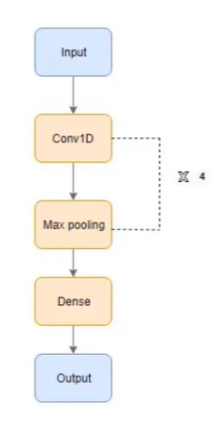

**Model building**

In [16]:
!pip uninstall keras -y
!pip uninstall keras-nightly -y
!pip uninstall keras-Preprocessing -y
!pip uninstall keras-vis -y
!pip uninstall tensorflow -y

!pip install tensorflow==2.3.0
!pip install keras==2.4

Found existing installation: keras 2.7.0
Uninstalling keras-2.7.0:
  Successfully uninstalled keras-2.7.0
Found existing installation: keras-nightly 2.5.0.dev2021032900
Uninstalling keras-nightly-2.5.0.dev2021032900:
  Successfully uninstalled keras-nightly-2.5.0.dev2021032900
Found existing installation: Keras-Preprocessing 1.1.2
Uninstalling Keras-Preprocessing-1.1.2:
  Successfully uninstalled Keras-Preprocessing-1.1.2


Found existing installation: tensorflow 2.5.0
Uninstalling tensorflow-2.5.0:
  Successfully uninstalled tensorflow-2.5.0


ERROR: Exception:
Traceback (most recent call last):
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_internal\cli\base_command.py", line 228, in _main
    status = self.run(options, args)
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_internal\commands\uninstall.py", line 93, in run
    uninstall_pathset.commit()
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_internal\req\req_uninstall.py", line 450, in commit
    self._moved_paths.commit()
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_internal\req\req_uninstall.py", line 290, in commit
    save_dir.cleanup()
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_internal\utils\temp_dir.py", line 199, in cleanup
    rmtree(ensure_text(self._path))
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_vendor\retrying.py", line 49, in wrapped_f
    return Retrying(*dargs, **dkw).call(f, *args, **kw)
  File "C:\Users\DELL\anaconda3\lib\site-packages\pip\_vendor\retrying.py", line 212, in call
    raise att

  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached gast-0.3.3-py2.py3-none-any.whl (9.7 kB)
  Using cached numpy-1.18.5-cp38-cp38-win_amd64.whl (12.8 MB)
  Using cached scipy-1.4.1-cp38-cp38-win_amd64.whl (31.0 MB)
  Using cached h5py-2.10.0-cp38-cp38-win_amd64.whl (2.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.2
    Uninstalling numpy-1.19.2:
      Successfully uninstalled numpy-1.19.2


ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\DELL\\anaconda3\\Lib\\site-packages\\~umpy\\core\\_multiarray_tests.cp38-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.5.0
    Uninstalling tensorflow-estimator-2.5.0:
      Successfully uninstalled tensorflow-estimator-2.5.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.5.0
    Uninstalling tensorboard-2.5.0:
      Successfully uninstalled tensorboard-2.5.0


ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.

tensorflow 2.7.0 requires keras<2.8,>=2.7.0rc0, but you'll have keras 2.4.0 which is incompatible.


In [22]:
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, Input, MaxPooling1D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K
K.clear_session()

In [25]:
inputs = Input(shape=(8000,1))

#First Conv1D layer
conv = Conv1D(8,13, padding='valid', activation = 'relu',strides = 1)(inputs)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Second Conv1D layer
conv = Conv1D(16,11, padding='valid', activation = 'relu',strides = 1)(conv)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Third Conv1D layer
conv = Conv1D(32,9, padding='valid', activation = 'relu',strides = 1)(conv)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Fourth Conv1D layer
conv = Conv1D(64,7, padding='valid', activation = 'relu',strides = 1)(conv)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Flatten layer
conv = Flatten()(conv)

#Dense Layer 1
conv = Dense(256,activation='relu')(conv)
cpnv = Dropout(0.3)(conv)

#Dense Layer 2
conv = Dense(128, activation='relu')(conv)
conv = Dropout(0.3)(conv)

outputs = Dense(len(labels), activation = 'softmax')(conv)

model= Model(inputs,outputs)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 8000, 1)]         0         
_________________________________________________________________
conv1d (Conv1D)              (None, 7988, 8)           112       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 2662, 8)           0         
_________________________________________________________________
dropout (Dropout)            (None, 2662, 8)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2652, 16)          1424      
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 884, 16)           0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 884, 16)           0     

In [26]:
model.compile(loss = 'categorical_crossentropy', optimizer ='adam', metrics =['accuracy'])

In [27]:
es = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 10, min_delta = 0.0001)
mc = ModelCheckpoint("best_model.hdf5", monitor = 'val_acc', verbose = 1, save_best_only = True, mode = 'max')

In [28]:
history = model.fit(x_tr, y_tr, epochs = 100, callbacks= [es,mc], batch_size =32, validation_data = (x_val, y_val))

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
533/533 [==============================] - ETA: 0s - loss: 1.9822 - accuracy: 0.2517WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x00000157F3CB0700> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, s

In [30]:
model.save("best_model.hdf5")

**Diagnostic plot**

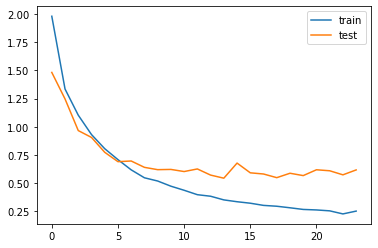

In [29]:
from matplotlib import pyplot
pyplot.plot(history.history['loss'], label = 'train')
pyplot.plot(history.history['val_loss'], label = 'test')
pyplot.legend()
pyplot.savefig('pyplot.jpg')
pyplot.show()

**Loading the best model**

In [31]:
from tensorflow.keras.models import load_model
model = load_model('best_model.hdf5')
def predict(audio):
    prob = model.predict(audio.reshape(1,8000,1))
    index = np.argmax(prob[0])
    return classes[index]

In [60]:
import random
index = random.randint(0,len(x_val)-1)
samples = x_val[index].ravel()
print('Audio: ', classes[np.argmax(y_val[index])])
ipd.Audio(samples, rate = 8000)
print('Text: ', predict(samples))

Audio:  right
Text:  right


**Prediction on validation data**

In [69]:
l=len(x_val)
k=0
i=0
for i in range(l-1):
    samples = x_val[i].ravel()
    s1 =  classes[np.argmax(y_val[i])]
    ipd.Audio(samples, rate = 8000)
    s2 = predict(samples)
    if s1==s2:
        k=k+1
print("Accuracy: ", (k/l)*100)

Accuracy:  82.9462819610603


**Script that prompts a  user to record voice commands. Record your own voice commands and test it on the model.**

In [93]:
!pip install sounddevice
!pip install soundfile

In [94]:
import sounddevice as sd
import soundfile as sf

In [151]:
samplerate = 16000
duration = 1 # seconds
filename = 'yes.wav'
print("start")
mydata = sd.rec(int(samplerate*duration),samplerate = samplerate,channels = 1, blocking = True)
print("end")
sd.wait()
sf.write(filename, mydata, samplerate)

start
end


**Lets now read the saved voice command and convert it to text.**

In [152]:
os.listdir(r'‪C:\Users\DELL'.strip('\u202a'))
filepath = r'‪C:\Users\DELL'.strip('\u202a')

# Reading the voice commands
samples, sample_rate = librosa.load(filepath + '\\' + 'yes.wav',sr =16000)
samples = librosa.resample(samples,sample_rate,8000)
ipd.Audio(samples,rate = 8000)

predict(samples)

'yes'

## Data Exploration and Visualization

**Import packages**

In [70]:
import os 
import librosa  # for audio processing
import IPython.display as ipd
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import wavfile # for audio processing
import warnings
warnings.filterwarnings("ignore")

**Visualize the audio file in time series domain graph**

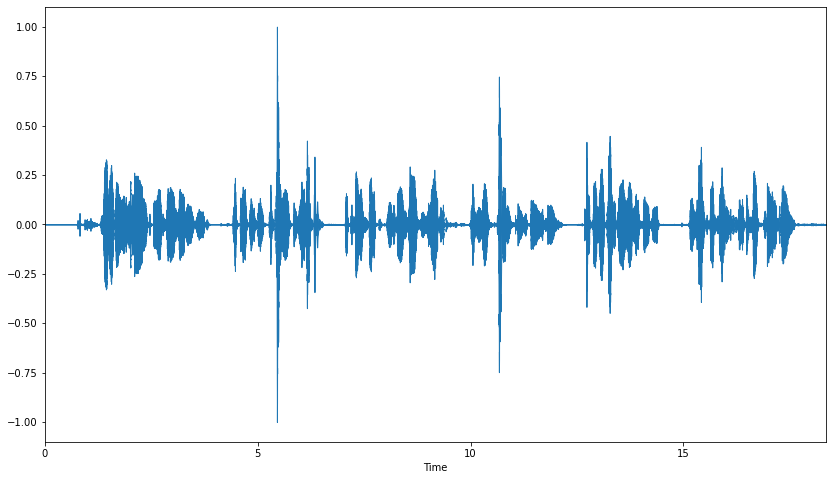

In [72]:
audio_path = r"C:\Users\DELL\Downloads\Audio\Audio+File+Analysis\Audio File Analysis\harvard.wav"
sample,sample_rate = librosa.load(audio_path)
fig = plt.figure(figsize = (14,8))
librosa.display.waveplot(sample, sr = sample_rate)

**Sampling Rate**

In [73]:
ipd.Audio(sample, rate = sample_rate)

In [74]:
print(sample_rate)

22050


**Resampling (to 800Hz from 22050Hz)**

In [83]:
samples = librosa.resample(sample, sample_rate, 8000)
ipd.Audio(samples, rate = 8000)

## Wave Analysis of Heartbeat

**Import packages**

In [3]:
import librosa

In [8]:
audio_path = r"‪C:\Users\DELL\Downloads\Audio\Wave+Analysis+of+Heart+Beat+Sound\Wave Analysis of Heart Beat Sound\heart_beat_sound.wav".strip('\u202a')
x,sr = librosa.load(audio_path)
print(type(x),type(sr))

<class 'numpy.ndarray'> <class 'int'>


**Display waveform**

In [9]:
import matplotlib.pyplot as plt
import librosa.display

**Extract Zero Crossing Rate**

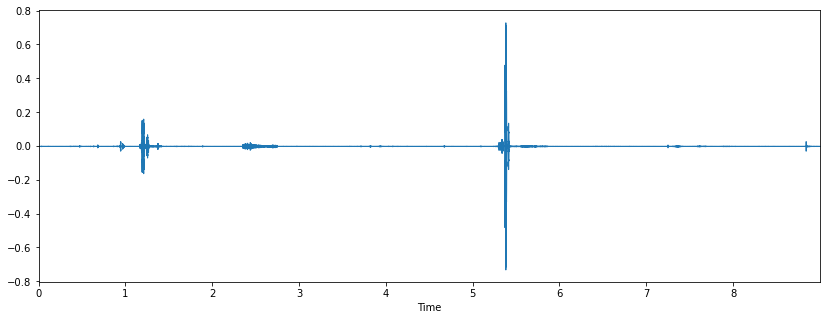

In [10]:
plt.figure(figsize = (14,5))
librosa.display.waveplot(x,sr=sr)

**Zooming in to see the Variance in Deviation**

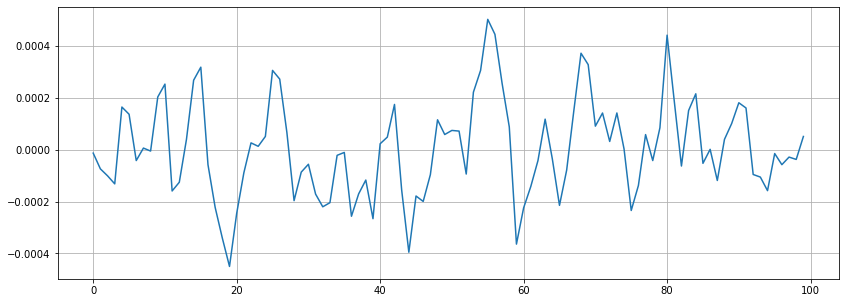

In [11]:
n0 = 9000
n1 = 9100
plt.figure(figsize = (14,5))
plt.plot(x[n0:n1])
plt.grid()

## Multilingual Speech

**Import packages**

In [3]:
from gtts import gTTS

**Write "hello" in English to audio file**

In [6]:
tts = gTTS("hello", lang = "en")
tts.save("hello.mp3")

**Write "hello bonjour" in English and then in French to "hello_bonjour"**

In [7]:
tts_en = gTTS("hello",lang = "en")
tts_fr = gTTS("bonjour",lang = "fr")
with open("hello_bonjour.mp3","wb") as f:
    tts_en.write_to_fp(f)
    tts_fr.write_to_fp(f)

## Speech to Speech Translation

**Import Packages**

In [9]:
import speech_recognition as sr

**Using record() to capture Data from audio file**

In [10]:
text_data = sr.AudioFile(r"C:\Users\DELL\Downloads\Audio\Speech+to+Speech+Translation\Speech to Speech Translation\0b56bcfe_nohash_0.wav".strip('\u202a'))

In [11]:
r=sr.Recognizer()
with text_data as source:
    audio = r.record(source)

In [12]:
type(audio)

speech_recognition.AudioData

In [13]:
text=r.recognize_google(audio)
print(text)

staff


**Speech Translation**

In [14]:
from googletrans import Translator

In [15]:
translator = Translator()

In [16]:
translation = translator.translate("Hola Mundo")
print(f"{translation.origin} ({translation.src}) --> {translation.text} ({translation.dest})")

Hola Mundo (es) --> Hello World (en)


In [17]:
translator.translate(text,dest='la')

In [20]:
print(translator.translate(text,dest="hi"))

Translated(src=en, dest=hi, text=कर्मचारी, pronunciation=karmachaaree, extra_data="{'translat...")


## Voice Building using Text: Personal Voice Assistant

**Import Packages**

In [1]:
import speech_recognition as sr
import playsound  # to play saved mp3 file
from gtts import gTTS  # google text to speech
import os    # to save/open files
import wolframalpha  # to calculate strings into formula
from selenium import webdriver  # to control browser operations

**Saving the text to audio files**

In [26]:
num = 1
def assistant_speaks(output):
    global num
    
    # num to rename every audio file
    # with different name to remove ambiguity
    num += 1
    print("PerSon : ",output)
    
    toSpeak = gTTS(text = output, lang = "en", slow = False)
    # saving the audio file given by google text to speech
    file = r"C:\Users\DELL\Downloads\\"+str(num)+".mp3".strip('\u202a')
    toSpeak.save(file)
    
    # playsound package is used to play the same file.
    playsound.playsound(file,True)
    os.remove(file)

**Get audio file and return as function OUTPUT**

In [27]:
def get_audio():
    
    rObject = sr.Recognizer()
    audio = ''
    
    with sr.Microphone() as source:
        print("Speak...")
        
        # recording the audio using speech recognition
        audio = rObject.listen(source,phrase_time_limit = 5)
    print("Stop.")  # limit 5 secs
    
    try:
        text = rObject.recognize_google(audio, language = "en-US")
        print("You : ", text)
        return text
    except:
        assistant_speaks("Could not understand your audio. Please try again !")
        return 0

**Write a main function**

In [29]:
# Driver code
if __name__=="__main__":
    assistant_speaks("What's your name, Human?")
    name = "Human"
    name = get_audio()
    assistant_speaks("Hello, "+name + ".")
    
    while(1):
        
        assistant_speaks("What can I do for you?")
        text = get_audio().lower()
        
        if text == 0:
            continue
        if "exit" in str(text) or "bye" in str(text) or "sleep" in str(text):
            assistant_speaks("OK bye, "+ name + ".")
            break
            
        # calling process text to process the query
#         process_text(text)

PerSon :  What's your name, Human?
Speak...
Stop.
You :  my name is Pragya Shukla
PerSon :  Hello, my name is Pragya Shukla.
PerSon :  What can I do for you?
Speak...
Stop.
You :  don't do anything for me ok bye
PerSon :  OK bye, my name is Pragya Shukla.


## Speaker Identification

**Import Packages**

In [8]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pathlib
import librosa.display
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import librosa

**Get the data directories**

In [9]:
data_dir = r"C:\Users\DELL\Downloads\Audio\Speaker+Identification\Speaker Identification\speeches_dataset\16000_pcm_speeches\\"
os.listdir(data_dir)

['Benjamin_Netanyau',
 'Jens_Stoltenberg',
 'Julia_Gillard',
 'Magaret_Tarcher',
 'Nelson_Mandela',
 'other',
 'tf_Wav_reader.py',
 '_background_noise_']

**Process training data**

In [12]:
def get_wav_paths(speaker):
    speaker_path = data_dir + speaker
    all_paths = [item for item in os.listdir(speaker_path)]
    return all_paths

In [13]:
nelson_mandela_paths = get_wav_paths("Nelson_Mandela")
margaret_thatcher_paths = get_wav_paths("Magaret_Tarcher")
benjamin_netanyau_paths = get_wav_paths("Benjamin_Netanyau")
jens_stoltenberg_paths = get_wav_paths( 'Jens_Stoltenberg')
julia_gillard_paths = get_wav_paths("Julia_Gillard")

noise1_paths = get_wav_paths("_background_noise_")
noise2_paths = get_wav_paths("other")

**Load the data**

In [14]:
def load_wav(wav_path, speaker):
    with tf.compat.v1.Session(graph=tf.compat.v1.Graph()) as sess:
        wav_path = data_dir + speaker + "/" + wav_path
        wav_filename_placeholder = tf.compat.v1.placeholder(tf.compat.v1.string, [])
        wav_loader = tf.io.read_file(wav_filename_placeholder)
        wav_decoder = tf.audio.decode_wav(wav_loader, desired_channels=1)
        wav_data = sess.run(
            wav_decoder, feed_dict={
                wav_filename_placeholder: wav_path
            }).audio.flatten().reshape((1, 16000))
        sess.close()
    return wav_data

**Create training data**

In [15]:
def generate_training_data(speaker_paths, speaker, label):
    wavs, labels = [], []
    for i in tqdm(speaker_paths):
        wav = load_wav(i, speaker)
        wavs.append(wav)
        labels.append(label)
    return wavs, labels

In [16]:
nelson_mandela_wavs, nelson_mandela_labels = generate_training_data(nelson_mandela_paths, "Nelson_Mandela", 0) 
margaret_thatcher_wavs, margaret_thatcher_labels = generate_training_data(margaret_thatcher_paths, "Magaret_Tarcher", 1) 
benjamin_netanyau_wavs, benjamin_netanyau_labels = generate_training_data(benjamin_netanyau_paths, "Benjamin_Netanyau", 2) 
jens_stoltenberg_wavs, jens_stoltenberg_labels = generate_training_data(jens_stoltenberg_paths, "Jens_Stoltenberg", 3) 
julia_gillard_wavs, julia_gillard_labels = generate_training_data(julia_gillard_paths, "Julia_Gillard", 4) 

100%|██████████| 1501/1501 [00:05<00:00, 262.01it/s]


In [18]:
nelson_mandela_labels[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [19]:
nelson_mandela_wavs

[array([[-3.0517578e-05, -3.0517578e-05, -3.0517578e-05, ...,
         -3.6407471e-02, -2.1942139e-02, -7.7728271e-02]], dtype=float32),
 array([[-0.11160278, -0.22103882, -0.3041687 , ..., -0.04525757,
         -0.04342651, -0.3071289 ]], dtype=float32),
 array([[-0.209198  , -0.32199097, -0.22705078, ...,  0.07595825,
          0.14093018,  0.07293701]], dtype=float32),
 array([[0.02120972, 0.18371582, 0.17803955, ..., 0.444458  , 0.28320312,
         0.41360474]], dtype=float32),
 array([[ 0.12680054,  0.006073  , -0.02633667, ...,  0.23764038,
          0.17800903,  0.14074707]], dtype=float32),
 array([[ 0.12167358,  0.08822632, -0.03408813, ..., -0.20785522,
         -0.14523315, -0.3371277 ]], dtype=float32),
 array([[-0.11154175, -0.19784546, -0.26242065, ...,  0.02905273,
         -0.00125122,  0.15667725]], dtype=float32),
 array([[-0.02655029,  0.07748413,  0.11071777, ...,  0.41070557,
          0.45806885,  0.6588745 ]], dtype=float32),
 array([[ 0.4529419 ,  0.7380066 ,  

In [20]:
np.array(nelson_mandela_wavs).shape

(1500, 1, 16000)

In [21]:
np.array(nelson_mandela_labels).shape

(1500,)

**Remove the extra wav for Julia Gillard**

In [22]:
julia_gillard_labels = julia_gillard_labels[1:]
julia_gillard_wavs = julia_gillard_wavs[1:]

In [23]:
np.array(julia_gillard_labels).shape

(1500,)

In [24]:
all_wavs = nelson_mandela_wavs + margaret_thatcher_wavs + benjamin_netanyau_wavs + jens_stoltenberg_wavs + julia_gillard_wavs
all_labels = nelson_mandela_labels + margaret_thatcher_labels + benjamin_netanyau_labels + jens_stoltenberg_labels + julia_gillard_labels

**Mixing Noise in the training data**

In [25]:
from scipy.io.wavfile import read
from scipy.io.wavfile import write
from random import randint

def cut_random_section(noise2, size2):
    size21 = noise2.size
    starting_point2 = randint(0,(noise2.size - size2))
    end_point2 = starting_point2 + size2
    noise_cut_part2 = noise2[starting_point2:end_point2]
    return noise_cut_part2

def mix(audio1, noise1, snr1):
    audio_max = max(audio1)
    if audio_max==0:
        audio_max = int(np.random.uniform(0.7,1)*32767)
    audio1 = audio1*1.
    audio1 = audio1/audio_max
    noise1 = cut_random_section(noise1, audio1.size)
    noise1 = noise1*1.
    noise1 = noise1/max(noise1)
    gain = pow(10,(snr1/10.))
    numerator = np.mean(abs(audio1)**2)
    denominator = numerator/gain
    noise_power = np.mean(abs(noise1)**2)
    mult_value = (denominator/noise_power)**0.5
    noisy1 = audio1 + noise1*mult_value
    if max(audio1)==0:
        noisy1 = noise1
    else:    
        noisy1 = noisy1/max(noisy1)
    noisy1 = np.array(noisy1*audio_max, dtype='int16')
    return noise1*mult_value, mult_value, noisy1

noise_wavs = []
noise_labels = []
snr_dB = 10
for i in range(len(all_wavs)):
    for noise in os.listdir(data_dir + 'other'):
        fs, noise_file = read(data_dir + 'other/' + noise)
        x = all_wavs[i][0]
        noise_temp, mult_value, noisy = mix(x, noise_file, snr_dB)
        if noisy.any() != 0:
            noise_wavs.append(noisy)
            noise_labels.append(all_labels[i])
    for noise in os.listdir(data_dir + '_background_noise_'):
        fs, noise_file = read(data_dir + '_background_noise_/' + noise)
        x = all_wavs[i][0]
        if len(noise_file.shape) > 1:
            noise_file = np.reshape(noise_file, (noise_file.shape[0]*noise_file.shape[1]))
        noise_temp, mult_value, noisy = mix(x, noise_file, snr_dB)
        if noisy.any() != 0:
            noise_wavs.append(noisy)
            noise_labels.append(all_labels[i]) 
    if i%200 == 0:
        print(i)

C:\Users\DELL\AppData\Local\Temp/ipykernel_11844/1263193249.py:46: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, noise_file = read(data_dir + '_background_noise_/' + noise)


0
200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
3200
3400
3600
3800
4000
4200
4400
4600
4800
5000
5200
5400
5600
5800
6000
6200
6400
6600
6800
7000
7200
7400


In [26]:
for i in range(len(all_wavs)):
    noise_labels.append(all_labels[i])
    noise_wavs.append(all_wavs[i][0])
final_wavs = np.array(noise_wavs)
final_labels = np.array(noise_labels)

print(final_wavs.shape,final_labels.shape)

(8159, 16000) (8159,)


**Split the dataset into trainin and testing set**

In [27]:
train_wavs,test_wavs,train_labels,test_labels = train_test_split(final_wavs,final_labels,test_size = 0.1)

In [28]:
train_x,train_y = np.array(train_wavs),np.array(train_labels)
test_x,test_y = np.array(test_wavs),np.array(test_labels)

**To convert [2] to [0,0,1,0] and [3] to [0,0,0,1]** 

In [29]:
train_y = tf.keras.utils.to_categorical(train_y)
test_y = tf.keras.utils.to_categorical(test_y)

In [30]:
train_y.shape

(7343, 5)

**MFCC Feature Extraction**

In [31]:

train_x_new = []
test_x_new = []
INPUT_SHAPE = (126,40)

train_x_new = np.zeros((train_x.shape[0], INPUT_SHAPE[0], INPUT_SHAPE[1]), dtype=np.float64)

count = 0
for sample in train_x:
    mfcc = librosa.feature.mfcc(y=sample, sr=16000, hop_length=128, n_fft=256, n_mfcc=20)
    mfcc_delta = librosa.feature.delta(mfcc)[:10, :]
    mfcc_double_delta = librosa.feature.delta(mfcc, order=2)[:10, :]
    train_x_new[count, :, :20] = mfcc.T
    train_x_new[count, :, 20:30] = mfcc_delta.T
    train_x_new[count, :, 30:] = mfcc_double_delta.T
    count += 1
    if count%500 == 0:
        print('Train', count)
        
test_x_new = np.zeros((test_x.shape[0], INPUT_SHAPE[0], INPUT_SHAPE[1]), dtype=np.float64)

count = 0
for sample in test_x:
    mfcc = librosa.feature.mfcc(y=sample, sr=16000, hop_length=128, n_fft=256, n_mfcc=20)
    mfcc_delta = librosa.feature.delta(mfcc)[:10, :]
    mfcc_double_delta = librosa.feature.delta(mfcc, order=2)[:10, :]
    test_x_new[count, :, :20] = mfcc.T
    test_x_new[count, :, 20:30] = mfcc_delta.T
    test_x_new[count, :, 30:] = mfcc_double_delta.T
    count += 1
    if count%500 == 0:
        print('Test', count)

C:\Users\DELL\anaconda3\lib\site-packages\librosa\filters.py:238: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn(


Train 500
Train 1000
Train 1500
Train 2000
Train 2500
Train 3000
Train 3500
Train 4000
Train 4500
Train 5000
Train 5500
Train 6000
Train 6500
Train 7000
Test 500


In [32]:
train_x_new = np.expand_dims(train_x_new,axis = 3)
test_x_new = np.expand_dims(test_x_new,axis = 3)
print(train_x_new.shape,test_x_new.shape)

(7343, 126, 40, 1) (816, 126, 40, 1)


**Create a simple model**

In [33]:
# create a model
def create_model(speech_feature):
    model = tf.keras.Sequential()
    if speech_feature == "spectrogram":
        model.add(Spectrogram(n_dft=512, n_hop=256, input_shape=(1, 16000),
                            return_decibel_spectrogram=True, power_spectrogram=2.0,
                            trainable_kernel=False, name='static_stft'))
    elif speech_feature == "melspectrogram":
        model.add(Melspectrogram(sr=16000, n_mels=128,n_dft=512, n_hop=256,
                            input_shape=(1 , 16000),return_decibel_melgram=True,
                            trainable_kernel=False, name='melgram'))
        
    elif speech_feature == "mfcc":
        model.add(tf.keras.layers.Conv2D(128, (3, 3), activation="relu", input_shape=(126,40,1)))
        model.add(tf.keras.layers.MaxPool2D(pool_size=(2, 2)))
        model.add(tf.keras.layers.Conv2D(64, (3, 3), activation="relu"))
#         model.add(tf.keras.layers.MaxPool2D(pool_size=(2, 2)))

        model.add(tf.keras.layers.Flatten())        
        model.add(tf.keras.layers.Dense(5, activation="softmax"))
        model.compile(optimizer=tf.keras.optimizers.Adam(lr=3e-4)
                , loss = "categorical_crossentropy"
                , metrics = ["accuracy"])
        return model

    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation="relu"))
    model.add(tf.keras.layers.MaxPool2D(pool_size=(2, 2)))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(5, activation="softmax"))
    model.compile(optimizer=tf.keras.optimizers.Adam(lr=3e-4)
            , loss = "categorical_crossentropy"
            , metrics = ["accuracy"])
    return model

**MFCC model**

In [34]:
model = create_model("mfcc")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 38, 128)      1280      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 62, 19, 128)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 17, 64)        73792     
                                                                 
 flatten (Flatten)           (None, 65280)             0         
                                                                 
 dense (Dense)               (None, 5)                 326405    
                                                                 
Total params: 401,477
Trainable params: 401,477
Non-trainable params: 0
__________________________________________________

C:\Users\DELL\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


**Fitting the Model**

In [35]:
model.fit(x = train_x_new,y = train_y,epochs=5,validation_data=(test_x_new,test_y))

Epoch 1/5
230/230 [==============================] - 52s 223ms/step - loss: 0.7179 - accuracy: 0.8111 - val_loss: 0.2127 - val_accuracy: 0.9265
Epoch 2/5
230/230 [==============================] - 47s 206ms/step - loss: 0.2020 - accuracy: 0.9267 - val_loss: 0.1704 - val_accuracy: 0.9338
Epoch 3/5
230/230 [==============================] - 47s 205ms/step - loss: 0.1586 - accuracy: 0.9368 - val_loss: 0.1729 - val_accuracy: 0.9314
Epoch 4/5
230/230 [==============================] - 46s 200ms/step - loss: 0.1394 - accuracy: 0.9462 - val_loss: 0.1884 - val_accuracy: 0.9314
Epoch 5/5
230/230 [==============================] - 46s 202ms/step - loss: 0.1362 - accuracy: 0.9447 - val_loss: 0.2162 - val_accuracy: 0.9203


**Saving the model to local**

In [36]:
model.save('speaker_model.h5')

**Predicting the output and analyzing**

In [37]:
y_pred = model.predict(test_x_new)

In [38]:
y_pred.shape

(816, 5)

In [39]:
test_y.shape

(816, 5)

In [40]:
y_pred = np.argmax(y_pred,axis = 1)

In [41]:
test_y = np.argmax(test_y,axis = 1)

In [42]:
confusion_matrix(test_y,y_pred)

array([[171,   1,   1,   3,   5],
       [  1, 149,   5,   1,   3],
       [  2,   0, 136,   2,   4],
       [  2,   1,   5, 142,   7],
       [ 11,   1,   5,   5, 153]], dtype=int64)